In [37]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [38]:
import numpy as np
import numpy.random as npr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.model_selection import KFold
import pickle
from scipy import stats

from imports import *
from config import dir_config
from src.utils import pmf_utils, glm_hmm_utils
from src.utils.glm_hmm_utils_cv import cross_validation_split


In [39]:
processed_dir = Path(dir_config.data.processed)

with open(Path(processed_dir, f"glm_hmm_off_meds.pkl"), "rb") as f:
    off_meds_glm_hmm = pickle.load(f)

with open(Path(processed_dir, f"glm_hmm_on_meds.pkl"), "rb") as f:
    on_meds_glm_hmm = pickle.load(f)

In [40]:
n_trial_back = 1
max_n_state = 5

### Helper functions

In [41]:
def get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices):

    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params
    posterior_probs, weighted_sum = [], []
    for idx in trial_indices:
        posterior_probs.append(model.expected_states(data=choices[idx], input=input[idx], mask=np.array(mask[idx]).reshape(-1, 1))[0])
        weighted_sum.append(np.sum(weights * input[idx][None, :, :], axis=-1).T)
    sigmoid_output = 1 / (1 + np.exp(-np.concatenate(weighted_sum)))
    glm_hmm_expected_choice_prob = np.sum(sigmoid_output * np.concatenate(posterior_probs), axis=1, keepdims=True)

    posterior_cols = [f"posterior_probs_state_{i}" for i in range(1,1+np.concatenate(posterior_probs).shape[1])]

    df = pd.DataFrame(
        data=np.hstack(
            (
                np.concatenate(trial_indices).reshape(-1, 1),  # shape (n_trials, 1)
                np.concatenate(posterior_probs),  # shape (n_trials, n_states)
                glm_hmm_expected_choice_prob,  # shape (n_trials, 1)
                mask[np.concatenate(trial_indices)].values.reshape(-1, 1),  # shape (n_trials, 1)
                choices[np.concatenate(trial_indices)].reshape(-1, 1),  # shape (n_trials, 1)
                stimulus[np.concatenate(trial_indices)].values.reshape(-1, 1),  # shape (n_trials, 1)
                input[np.concatenate(trial_indices), 0].reshape(-1, 1),  # shape (n_trials, 1)
                input[np.concatenate(trial_indices), 1].reshape(-1, 1),  # shape (n_trials, 1)
            )
        ),
        columns=["trial_idx"] + posterior_cols + ["expected_choice_prob"] + ["mask"] + ["choices"] + ["stimulus"] + ["normalized_stimulus"] + ["color"],
    )

    # convert color values if < 0.5 to 0 and <=0.5 to 1
    df["color"] = df["color"].apply(lambda x: 0 if x < 0.5 else 1)

    df = df[df["mask"] == 1]  # include valid trials only
    df = df.drop(columns=["mask"])

    return df

In [42]:
def plot_psych(predicted_df, ax, n_sample=10):
    # plot equal and unequal psychometric fits
    equal_indices = predicted_df["color"] == 0
    unequal_indices = predicted_df["color"] == 1

    for indices, color, label in zip([equal_indices, unequal_indices], ["#377eb8", "#974810"], ["Equal", "Unequal"]):
        stimulus = predicted_df["stimulus"][indices]
        choices = predicted_df["choices"][indices]
        expected_choice_probs = predicted_df["expected_choice_prob"][indices]

        data = {"signed_coherence": np.array(stimulus) * 100, "choice": choices}
        x_data, y_data, model, x_model, y_model = pmf_utils.get_psychometric_data(data)

        x_model_hat, y_model_hat = np.full((n_sample, len(x_model)), np.nan), np.full((n_sample, len(y_model)), np.nan)

        for idx_sample in range(n_sample):
            data_fitted = {"signed_coherence": np.array(stimulus) * 100, "choice": npr.binomial(1, expected_choice_probs)}
            x_data, _, _, x_model_hat[idx_sample, :], y_model_hat[idx_sample, :] = pmf_utils.get_psychometric_data(data_fitted)

        ax.plot(x_data, y_data, "o", color=color)

        ax.plot(x_model, y_model, color=color, label=label)
        ax.plot(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0), color=color, linestyle="--")
        ax.fill_between(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0) - np.std(y_model_hat, axis=0), np.mean(y_model_hat, axis=0) + np.std(y_model_hat, axis=0), color=color, alpha=0.3)

    ax.set_xlim(min(x_data), max(x_data))
    ax.set_ylim(0, 1)
    ax.set_xlabel("Coherence")
    ax.set_ylabel("choices toRF")
    ax.set_title("Psychometric fits", fontsize=15)
    ax.legend()


In [43]:
def plot_state_prob(predicted_df, task_switch, ax):
    color = ["#ff7f00", "#4daf4a", "#377eb8"]
    # find out number of columns start with posterior_probs_state_
    posterior_cols = [col for col in predicted_df.columns if col.startswith("posterior_probs_state_")]
    for col_idx, col in enumerate(posterior_cols):
        ax.scatter(predicted_df["trial_idx"], predicted_df[col], s=1, color=color[col_idx])
        ax.plot([], [], color=color[col_idx], label=f"State {col_idx + 1}")
    ax.set_xlabel("Trial #")
    ax.set_ylabel("Posterior Probability")
    ax.set_title("State Posterior Probabilities", fontsize=15)
    ax.vlines(task_switch, ymin=-0.1, ymax=1.1, color="k", alpha=0.5, ls="--")
    ax.set_ylim(-0.1, 1.1)
    ax.legend()


In [44]:
def plot_model_params(model, axs):
    """
    Plot the model parameters: GLM weights and transition matrix.
    """
    color = ["#ff7f00", "#4daf4a", "#377eb8"]  # Colors for the states
    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params

    # Plot GLM weights
    for idx in range(weights.shape[0]):
        axs.plot(np.arange(weights.shape[2]), weights[idx][0], marker="o", color=color[idx], linestyle="-", lw=1.5, label=f"State {idx + 1}")

    axs.tick_params(axis="y", labelsize=10)
    axs.set_ylabel("GLM weight", fontsize=15)
    axs.set_xlabel("covariate", fontsize=15)
    labels = ["Stimulus", "Bias"] + [f"Prev Choice"] + [f"Prev Target"]
    axs.set_xticks(range(2 + 2 * n_trial_back))
    axs.set_xticklabels(labels, fontsize=12, rotation=15)

    axs.axhline(y=0, color="k", alpha=0.5, ls="--")
    axs.legend()
    axs.set_title("GLM weights", fontsize=15)


### Load Data

In [45]:
with open(Path(processed_dir, f"glm_hmm_off_meds.pkl"), "rb") as f:
    off_meds_glm_hmm = pickle.load(f)

with open(Path(processed_dir, f"glm_hmm_on_meds.pkl"), "rb") as f:
    on_meds_glm_hmm = pickle.load(f)

off_meds_session_ids = list(off_meds_glm_hmm["data"].keys())
on_meds_session_ids = list(on_meds_glm_hmm["data"].keys())

### Best fold for each session

In [46]:
best_state_idx = 0
best_state = best_state_idx + 1

In [47]:
session_wise_best_fold_off_meds = []
session_wise_best_fold_on_meds = []

for model, session_wise_best_fold in zip([off_meds_glm_hmm, on_meds_glm_hmm], [session_wise_best_fold_off_meds, session_wise_best_fold_on_meds]):
    for session in range(model["session_wise"]["test_ll"].shape[0]):
        session_wise_best_fold.append(np.argmax(model["session_wise"]["test_ll"][session, best_state_idx, :]))


### Get train/test  split for each session

In [48]:
off_meds_test_fold, off_meds_train_fold = {}, {}
for idx_session, session in enumerate(off_meds_session_ids):
    choices = off_meds_glm_hmm["data"][session]["choices"]
    best_fold = session_wise_best_fold_off_meds[idx_session]

    train_indices, test_indices = cross_validation_split(len(choices), idx_split=best_fold)
    # Store the train and test indices for the current session
    off_meds_train_fold[session] = train_indices
    off_meds_test_fold[session] = test_indices

on_meds_test_fold, on_meds_train_fold = {}, {}
for idx_session, session in enumerate(on_meds_session_ids):
    choices = on_meds_glm_hmm["data"][session]["choices"]
    best_fold = session_wise_best_fold_on_meds[idx_session]

    train_indices, test_indices = cross_validation_split(len(choices), idx_split=best_fold)
    # Store the train and test indices for the current session
    on_meds_train_fold[session] = train_indices
    on_meds_test_fold[session] = test_indices


## Model fits and data recovery (train and test)

### Train Dataset

#### Psychometric Fits, GLM weights, transition matrix, p(state)

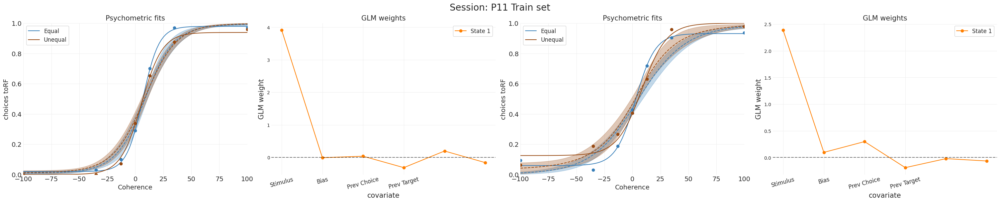

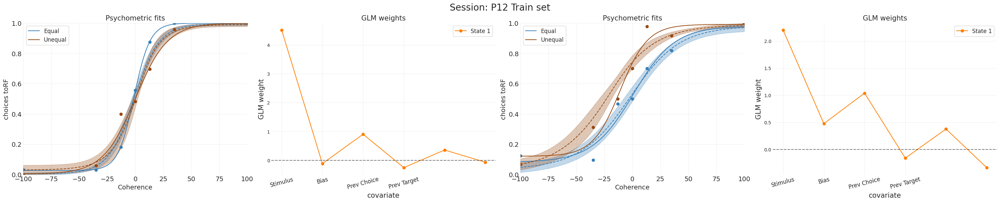

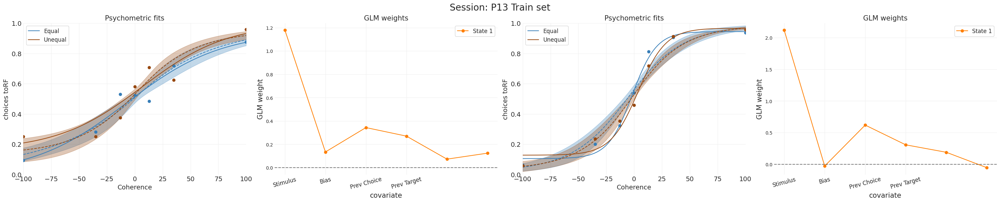

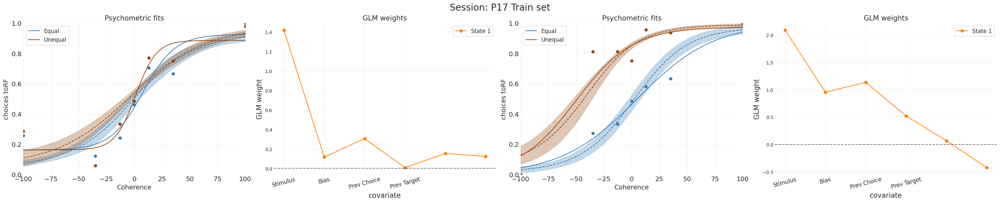

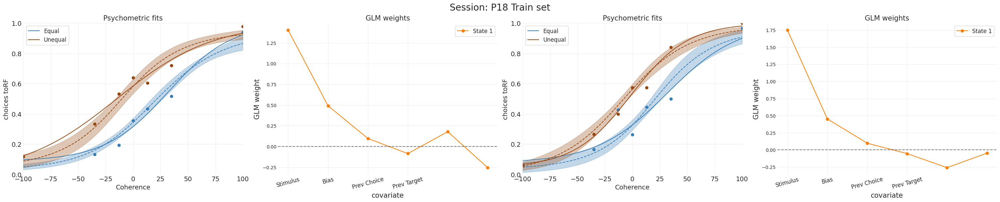

...

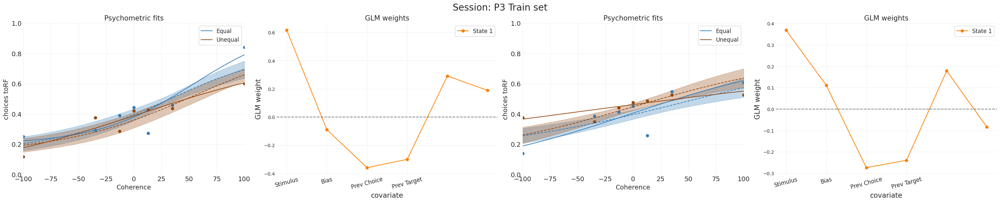

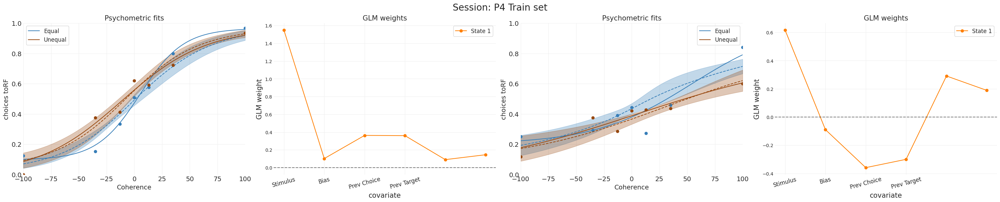

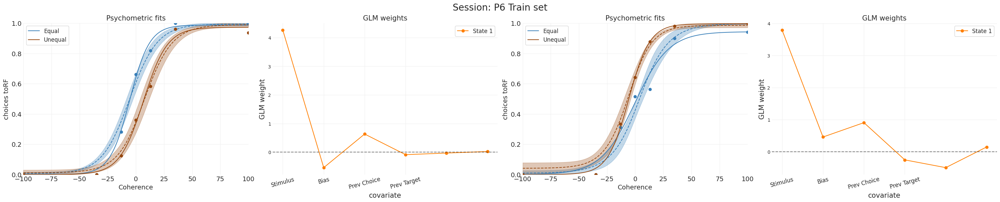

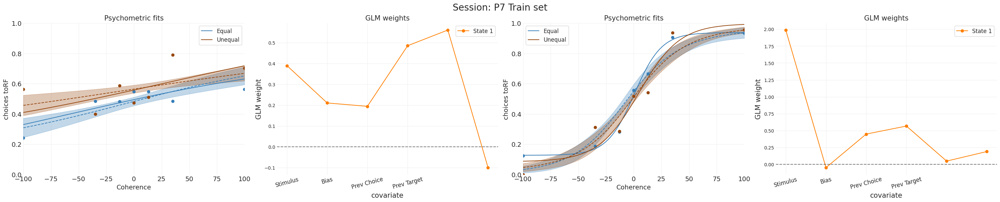

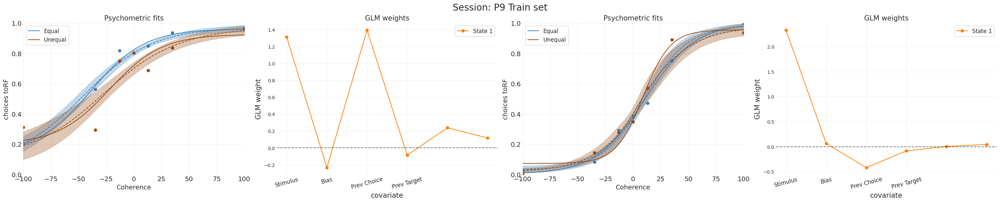

In [49]:
for idx_session, session in enumerate(off_meds_session_ids):
    fig, axs = plt.subplots(1, 4, figsize=(30, 6))
    plt.suptitle(f"Session: {session.replace('_OFF', '')} Train set", fontsize=20)

    # off meds
    train_idx = off_meds_train_fold[session]
    model = off_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_off_meds[idx_session]]
    choices = off_meds_glm_hmm["data"][session]["choices"].values.reshape(-1, 1)
    input = np.array(
        off_meds_glm_hmm["data"][session][
            ["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]
        ]
    )
    stimulus = off_meds_glm_hmm["data"][session]["stimulus"]
    mask = off_meds_glm_hmm["data"][session]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=train_idx)
    plot_psych(predicted_df, axs[0])
    plot_model_params(model, axs[1])

    # on meds
    session_id = session.replace("_OFF", "_ON")
    train_idx = on_meds_train_fold[session_id]
    model = on_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_on_meds[idx_session]]
    choices = on_meds_glm_hmm["data"][session_id]["choices"].values.reshape(-1, 1)
    input = np.array(
        on_meds_glm_hmm["data"][session.replace("_OFF", "_ON")][
            ["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]
        ]
    )
    stimulus = on_meds_glm_hmm["data"][session_id]["stimulus"]
    mask = on_meds_glm_hmm["data"][session_id]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=train_idx)
    plot_psych(predicted_df, axs[2])
    plot_model_params(model, axs[3])


### Test Dataset

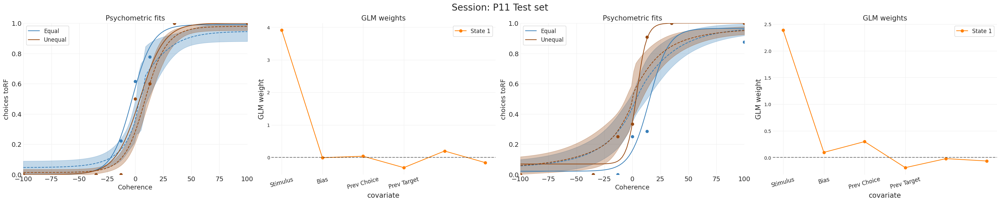

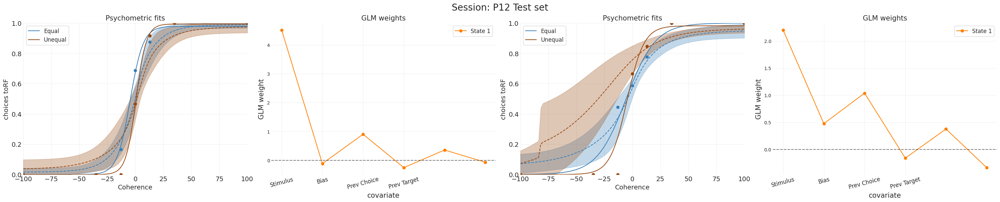

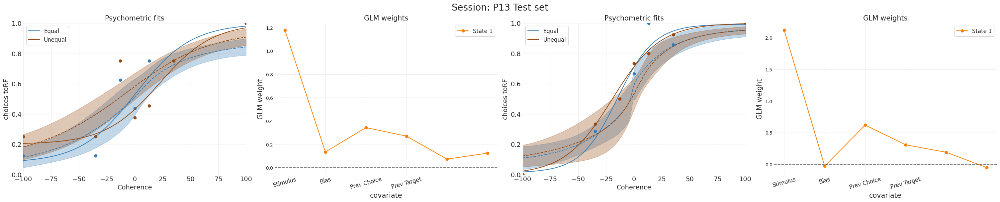

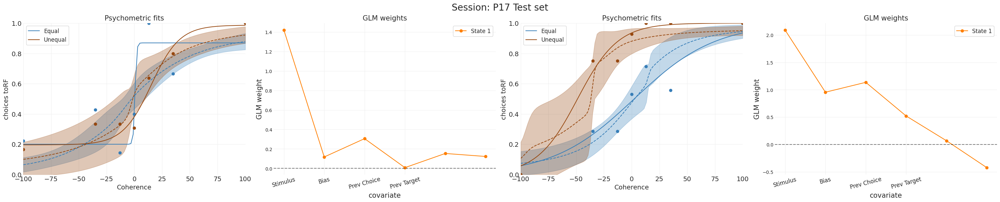

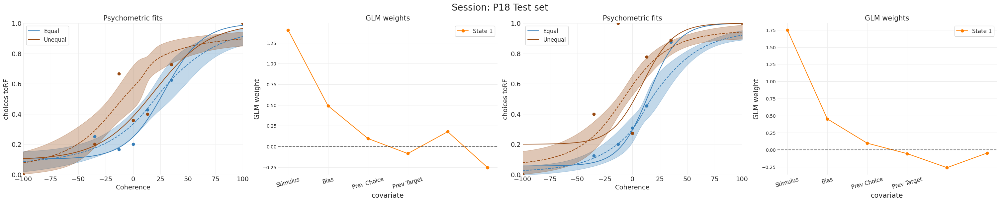

...

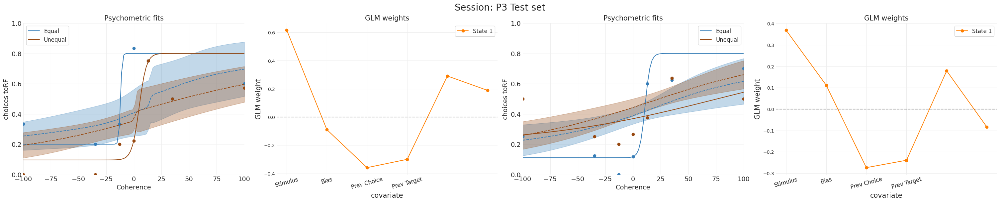

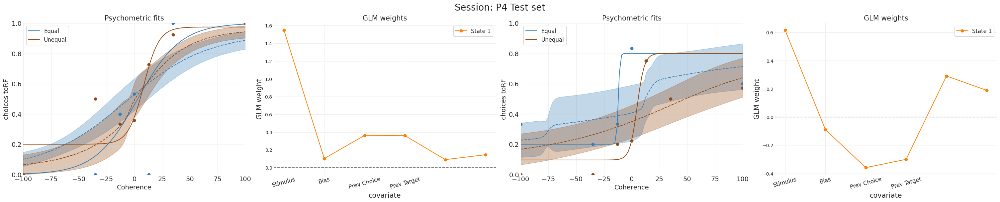

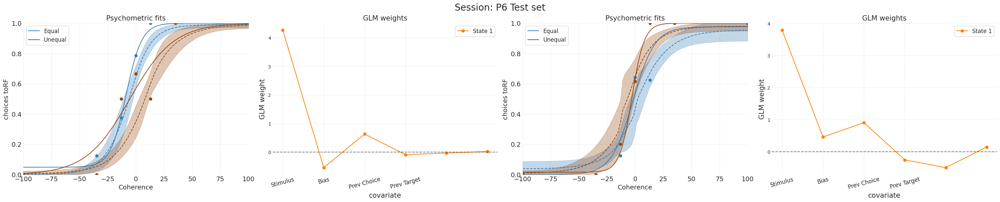

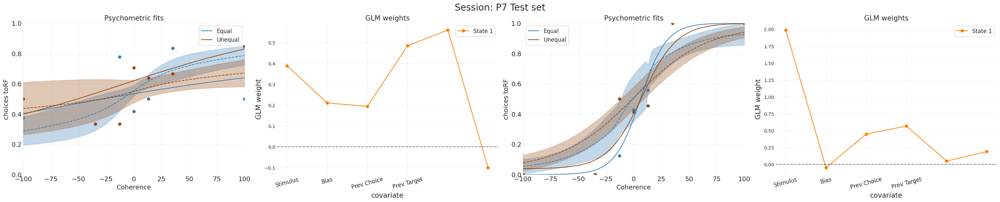

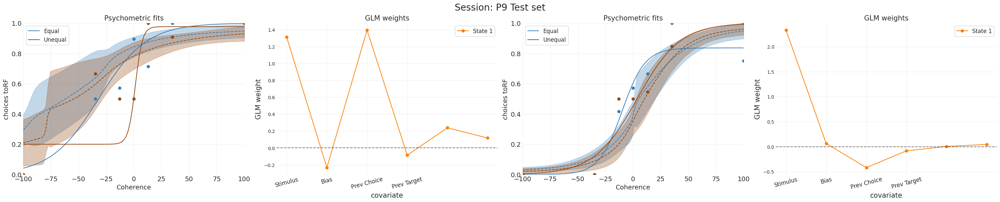

In [50]:
for idx_session, session in enumerate(off_meds_session_ids):
    fig, axs = plt.subplots(1, 4, figsize=(30, 6))
    plt.suptitle(f"Session: {session.replace('_OFF', '')} Test set", fontsize=20)

    # off meds
    test_idx = off_meds_test_fold[session]
    model = off_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_off_meds[idx_session]]
    choices = off_meds_glm_hmm["data"][session]["choices"].values.reshape(-1, 1)
    input = np.array(
        off_meds_glm_hmm["data"][session][["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]]
    )
    stimulus = off_meds_glm_hmm["data"][session]["stimulus"]
    mask = off_meds_glm_hmm["data"][session]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=test_idx)
    plot_psych(predicted_df, axs[0])
    plot_model_params(model, axs[1])

    # on meds
    session_id = session.replace("_OFF", "_ON")
    test_idx = on_meds_test_fold[session_id]
    model = on_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_on_meds[idx_session]]
    choices = on_meds_glm_hmm["data"][session_id]["choices"].values.reshape(-1, 1)
    input = np.array(
        on_meds_glm_hmm["data"][session.replace("_OFF", "_ON")][
            ["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]
        ]
    )
    stimulus = on_meds_glm_hmm["data"][session_id]["stimulus"]
    mask = on_meds_glm_hmm["data"][session_id]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=test_idx)
    plot_psych(predicted_df, axs[2])
    plot_model_params(model, axs[3])

# Fit on whole session and save model

### OFF Medication

In [51]:
# get parameter initializations for each session
init_params = {"glm_weights": {}, "transition_matrices": {}}
choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []

# choose best state and best fold model parameters to initialize
for idx_session, session in enumerate(off_meds_session_ids):
    init_params["glm_weights"][idx_session] = off_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_off_meds[idx_session]].observations.params
    init_params["transition_matrices"][idx_session] = off_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_off_meds[idx_session]].transitions.params

    choices_session_wise.append(off_meds_glm_hmm["data"][session]["choices"].values.reshape(-1, 1))
    inputs_session_wise.append(
        np.array(
            off_meds_glm_hmm["data"][session][
                ["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]
            ]
        )
    )
    masks_session_wise.append(off_meds_glm_hmm["data"][session]["mask"].values.reshape(-1, 1))


In [52]:
models_session, fit_ll_session = glm_hmm_utils.session_wise_fit(choices_session_wise, inputs_session_wise, masks=masks_session_wise, n_sessions=len(off_meds_session_ids), init_params=init_params, n_states=best_state, n_iters=2500)

models_session_wise, fit_lls_session_wise = {}, {}
for idx_session, session_id in enumerate(off_meds_session_ids):
    models_session_wise[session_id] = models_session[idx_session]
    fit_lls_session_wise[session_id] = fit_ll_session[idx_session]


Fitting sessions: 100%|██████████| 22/22 [00:00<00:00, 475642.72it/s]


In [53]:
# store data and models for session-wise
session_wise_fits = {
    "models": models_session_wise,
    "fit_lls": fit_lls_session_wise,
}

models_and_data = {
    "model": session_wise_fits,
    "data": off_meds_glm_hmm["data"],
}

with open(Path(processed_dir, f"glm_hmm_off_meds_final.pkl"), "wb") as f:
    pickle.dump(models_and_data, f)


### ON Meds

In [54]:
# get parameter initializations for each session
init_params = {"glm_weights": {}, "transition_matrices": {}}
choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []

# choose best state and best fold model parameters to initialize
for idx_session, session in enumerate(on_meds_session_ids):
    init_params["glm_weights"][idx_session] = on_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_on_meds[idx_session]].observations.params
    init_params["transition_matrices"][idx_session] = on_meds_glm_hmm["session_wise"]["models"][idx_session][best_state][session_wise_best_fold_on_meds[idx_session]].transitions.params

    choices_session_wise.append(on_meds_glm_hmm["data"][session]["choices"].values.reshape(-1, 1))
    inputs_session_wise.append(
        np.array(
            on_meds_glm_hmm["data"][session][
                ["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]
            ]
        )
    )
    masks_session_wise.append(on_meds_glm_hmm["data"][session]["mask"].values.reshape(-1, 1))


In [55]:
models_session, fit_ll_session = glm_hmm_utils.session_wise_fit(choices_session_wise, inputs_session_wise, masks=masks_session_wise, n_sessions=len(on_meds_session_ids), init_params=init_params, n_states=best_state, n_iters=2500)

models_session_wise, fit_lls_session_wise = {}, {}
for idx_session, session_id in enumerate(on_meds_session_ids):
    models_session_wise[session_id] = models_session[idx_session]
    fit_lls_session_wise[session_id] = fit_ll_session[idx_session]


Fitting sessions: 100%|██████████| 22/22 [00:00<00:00, 445771.44it/s]


In [56]:
# store data and models for session-wise
session_wise_fits = {
    "models": models_session_wise,
    "fit_lls": fit_lls_session_wise,
}

models_and_data = {
    "model": session_wise_fits,
    "data": on_meds_glm_hmm["data"],
}

with open(Path(processed_dir, f"glm_hmm_on_meds_final.pkl"), "wb") as f:
    pickle.dump(models_and_data, f)


### Final Model Fits and Params

In [57]:
with open(Path(processed_dir, f"glm_hmm_off_meds_final.pkl"), "rb") as f:
    off_meds_glm_hmm_final = pickle.load(f)

with open(Path(processed_dir, f"glm_hmm_on_meds_final.pkl"), "rb") as f:
    on_meds_glm_hmm_final = pickle.load(f)

off_meds_session_ids = list(off_meds_glm_hmm_final["data"].keys())
on_meds_session_ids = list(on_meds_glm_hmm_final["data"].keys())


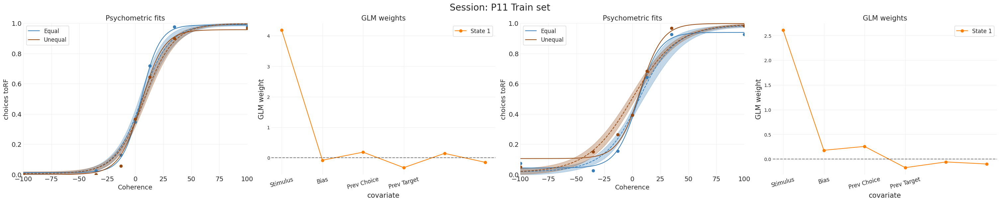

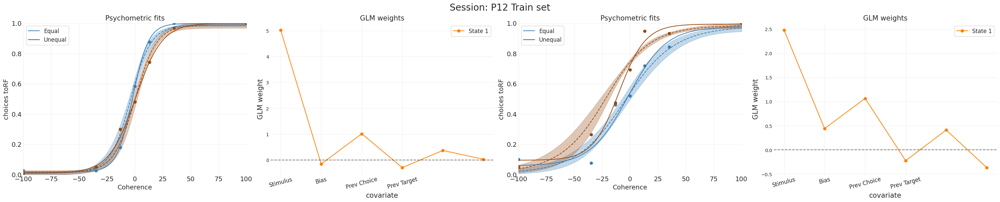

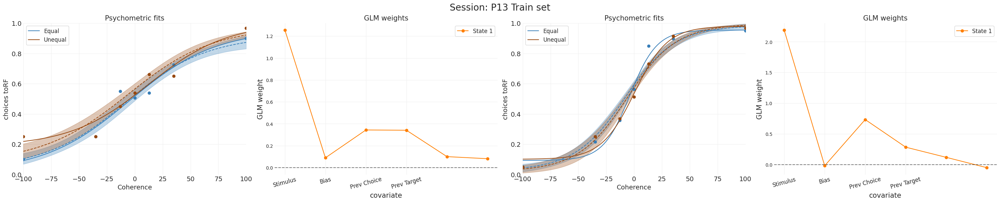

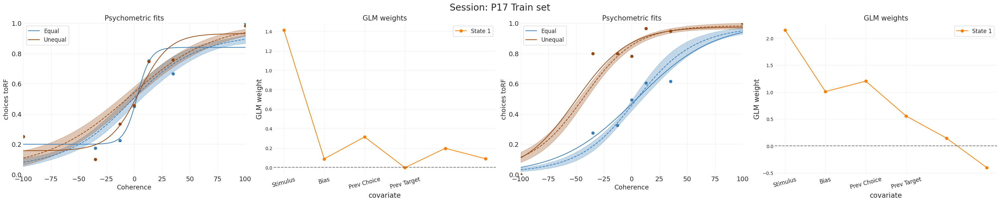

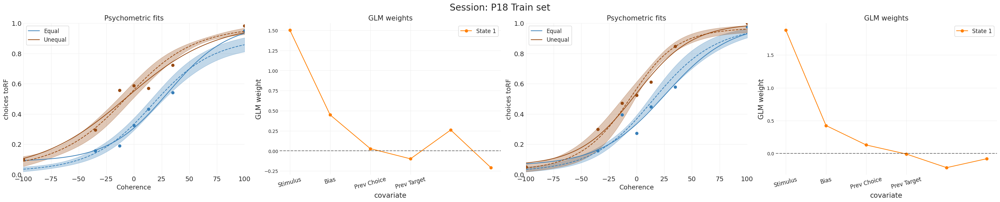

...

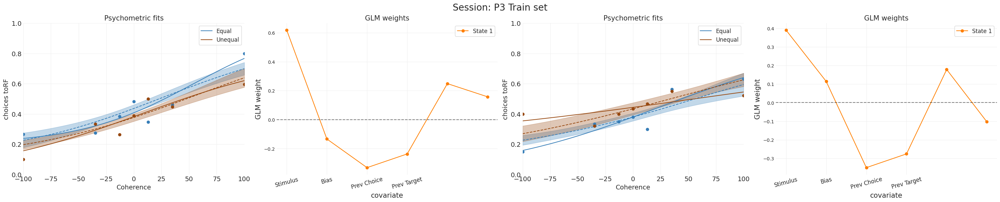

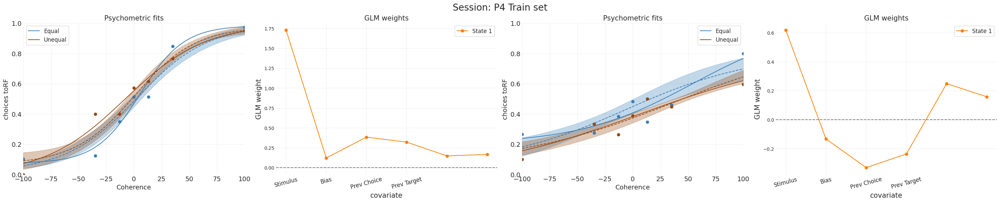

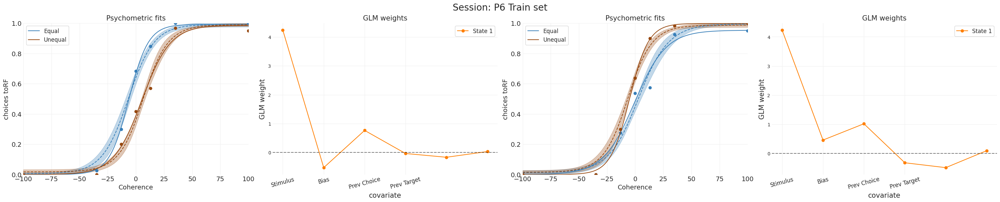

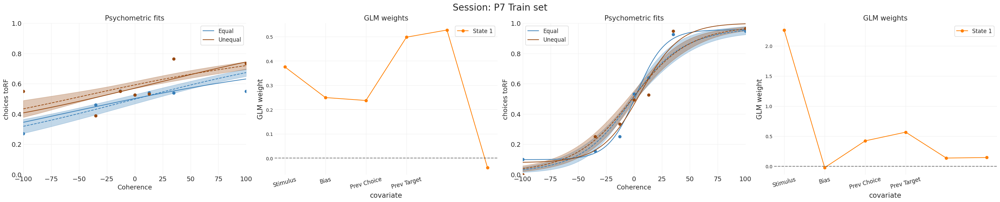

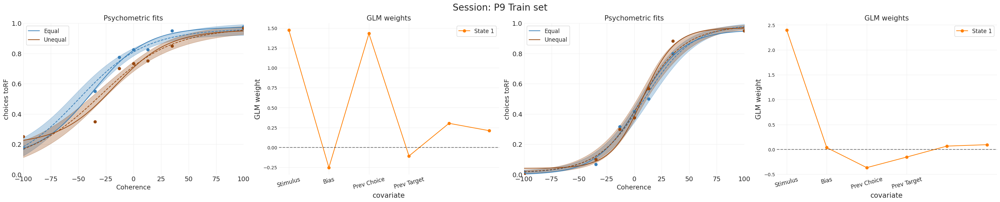

In [58]:
for idx_session, session in enumerate(off_meds_session_ids):
    fig, axs = plt.subplots(1, 4, figsize=(30, 6))
    plt.suptitle(f"Session: {session.replace('_OFF', '')} Train set", fontsize=20)

    # off meds
    model = off_meds_glm_hmm_final["model"]["models"][session]
    choices = off_meds_glm_hmm_final["data"][session]["choices"].values.reshape(-1, 1)
    input = np.array(
        off_meds_glm_hmm_final["data"][session][["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]]
    )
    stimulus = off_meds_glm_hmm_final["data"][session]["stimulus"]
    mask = off_meds_glm_hmm_final["data"][session]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=[np.arange(len(choices))])
    plot_psych(predicted_df, axs[0])
    plot_model_params(model, axs[1])

    # on meds
    session_id = session.replace("_OFF", "_ON")
    model = on_meds_glm_hmm_final["model"]["models"][session_id]
    choices = on_meds_glm_hmm_final["data"][session_id]["choices"].values.reshape(-1, 1)
    input = np.array(
        on_meds_glm_hmm_final["data"][session.replace("_OFF", "_ON")][
            ["normalized_stimulus", "color", "bias"] + [f"prev_choice_{t + 1}" for t in range(n_trial_back)] + [f"prev_target_{t + 1}" for t in range(n_trial_back)] + [f"prev_color_{t + 1}" for t in range(n_trial_back)]
        ]
    )
    stimulus = on_meds_glm_hmm_final["data"][session_id]["stimulus"]
    mask = on_meds_glm_hmm_final["data"][session_id]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=[np.arange(len(choices))])
    plot_psych(predicted_df, axs[2])
    plot_model_params(model, axs[3])


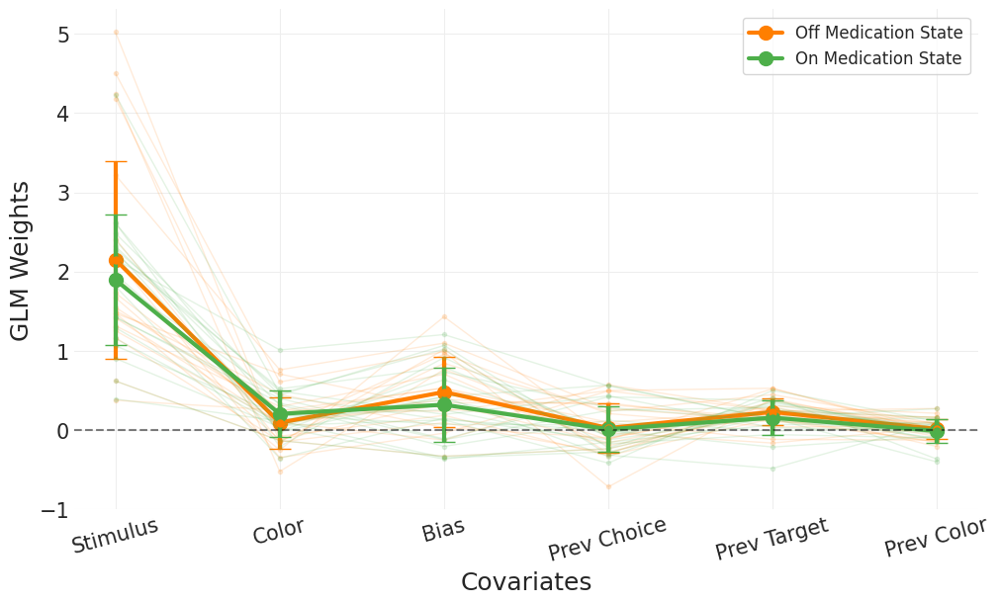

In [59]:
fig, ax = plt.subplots(1,1, figsize=(10, 6))  # Wider figure for better spacing

# Off Medication States
colors = ["#ff7f00"] # Colors for the states
labels = ["Off Medication State"]
glm_weights_session_wise = []
for idx_session, session_id in enumerate(off_meds_session_ids):
    model = off_meds_glm_hmm_final["model"]["models"][session_id]
    glm_weights = -np.array(model.observations.params).reshape(best_state, -1)
    glm_weights_session_wise.append(glm_weights)
    for k in range(best_state):
        ax.plot(np.arange(3 + 3 * n_trial_back), glm_weights[k], marker="o", color=colors[k], linestyle="-", markersize=3, lw=1, alpha=0.15)
for k in range(best_state):
    mean_weights = np.mean(np.array(glm_weights_session_wise), axis=0)
    std_weights = np.std(np.array(glm_weights_session_wise), axis=0)
    ax.errorbar(np.arange(3 + 3 * n_trial_back), mean_weights[k], yerr=std_weights[k], fmt="o", color=colors[k], markersize=5, lw=1.5, capsize=8, elinewidth=3)
    ax.plot(np.arange(3 + 3 * n_trial_back), np.mean(np.array(glm_weights_session_wise), axis=0)[k], marker="o", color=colors[k], linestyle="-", markersize=10, lw=3, label=labels[k])

# On Medication States
colors = ["#4daf4a"] # Colors for the states
labels = ["On Medication State"]
glm_weights_session_wise = []
for idx_session, session_id in enumerate(on_meds_session_ids):
    model = on_meds_glm_hmm_final["model"]["models"][session_id]
    glm_weights = -np.array(model.observations.params).reshape(best_state, -1)
    glm_weights_session_wise.append(glm_weights)
    for k in range(best_state):
        ax.plot(np.arange(3 + 3 * n_trial_back), glm_weights[k], marker="o", color=colors[k], linestyle="-", markersize=3, lw=1, alpha=0.15)
for k in range(best_state):
    mean_weights = np.mean(np.array(glm_weights_session_wise), axis=0)
    std_weights = np.std(np.array(glm_weights_session_wise), axis=0)
    ax.errorbar(np.arange(3 + 3 * n_trial_back), mean_weights[k], yerr=std_weights[k], fmt="o", color=colors[k], markersize=5, lw=1.5, capsize=8, elinewidth=3)
    ax.plot(np.arange(3 + 3 * n_trial_back), np.mean(np.array(glm_weights_session_wise), axis=0)[k], marker="o", color=colors[k], linestyle="-", markersize=10, lw=3, label=labels[k])


# Formatting
ax.tick_params(axis="y", labelsize=10)
ax.set_ylabel("GLM Weights", fontsize=18)
ax.set_xlabel("Covariates", fontsize=18)
ax.set_xticks(range(3 + 3 * n_trial_back))
# ax.set_ylim([-2, 5])
labels = ["Stimulus", "Color", "Bias", "Prev Choice", "Prev Target", "Prev Color"]

ax.set_xticklabels(labels, fontsize=15, rotation=15)
# ax.set_yticks(np.arange(-2, 8, 2))
ax.tick_params(axis="y", which="major", labelsize=15)
ax.axhline(y=0, color="k", alpha=0.5, ls="--")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.legend(fontsize=12, loc="upper right")

plt.show()
